In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
import utils

current_path = os.getcwd()
samples_rel_path = "../samples"

samples_path = os.path.join(current_path, samples_rel_path)

# Analisis de datos
A continuacion analizaremos los histogramas de diferentes productos para poder observar como se comportan

## 1. Dataset
Estas fueron las imagenes utilizadas:

### Primer Grupo: Grupo de productos iguales

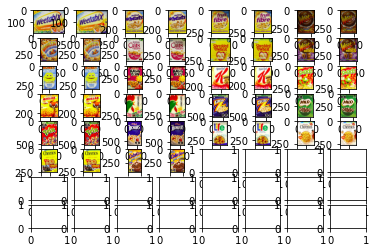

In [5]:
fig, axs = plt.subplots(8, 8)
row = 0
groups = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', \
    'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', \
    'q', 'r', 's', 't', 'u', 'v']
group = 0
for i in range (len(groups)*2):
    num = i%2
    col = i%8
    file = "same_product/" + groups[group] + str(num+1) + ".jpg"
    img = mpimg.imread(os.path.join(samples_path,file))
    axs[row][col].imshow(img)
    if col == 7:
        row += 1
    if i%2 == 1:
        group += 1
plt.show()

### Segundo grupo: Grupo de productos diferentes con un mismo diseño

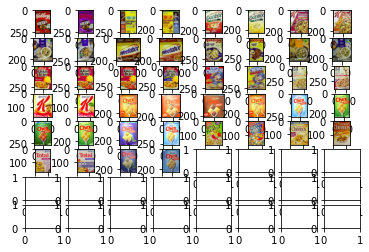

In [24]:
fig, axs = plt.subplots(8, 8)
row = 0
groups = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', \
    'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', \
    'q', 'r', 's', 't', 'u', 'v']
group = 0
for i in range (len(groups)*2):
    num = i%2
    col = i%8
    file = "diff_products/" + groups[group] + str(num+1) + ".jpg"
    img = mpimg.imread(os.path.join(samples_path,file))
    axs[row][col].imshow(img)
    if col == 7:
        row += 1
    if i%2 == 1:
        group += 1
plt.show()

Cargamos los datasets de productos iguales

In [6]:
distance = pd.read_csv("csv/distance.csv", sep=';')
meanstd = pd.read_csv("csv/meanstd.csv", sep=';')

distance.head(10)

,group_num,n_bins,distance,method
0,0,1,0.000000,Bhattacharyya
1,0,1,0.000000,Chisquare
2,0,1,1.000000,Correlation
3,0,1,0.000000,Chisquare Alt
4,0,1,1.000000,Intersect
5,0,1,0.000000,KL DIV
6,0,2,0.029804,Bhattacharyya
7,0,2,0.007225,Chisquare
8,0,2,0.988717,Correlation
9,0,2,0.007101,Chisquare Alt


In [7]:
meanstd.head()

,group_num,num_product,mean_0,mean_1,stddev_0,stddev_1
0,0,1,0.523155,0.602028,0.157303,0.241916
1,0,2,0.513648,0.607590,0.148738,0.248892
2,1,1,0.525698,0.598066,0.124901,0.262777
3,1,2,0.523224,0.600421,0.127882,0.264742
4,2,1,0.517106,0.627266,0.143064,0.226480


## 2. Comparacion de distancias, productos iguales

### 1. Battacharyya

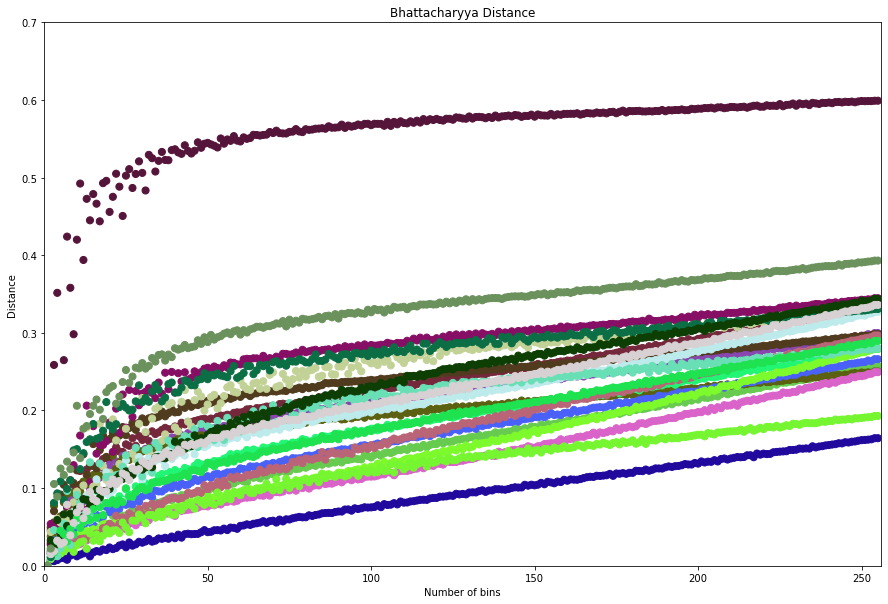

In [8]:
utils.plot_distance_method("Bhattacharyya", distance, [0, 256], [0, 0.7])

### 2. Chisquare

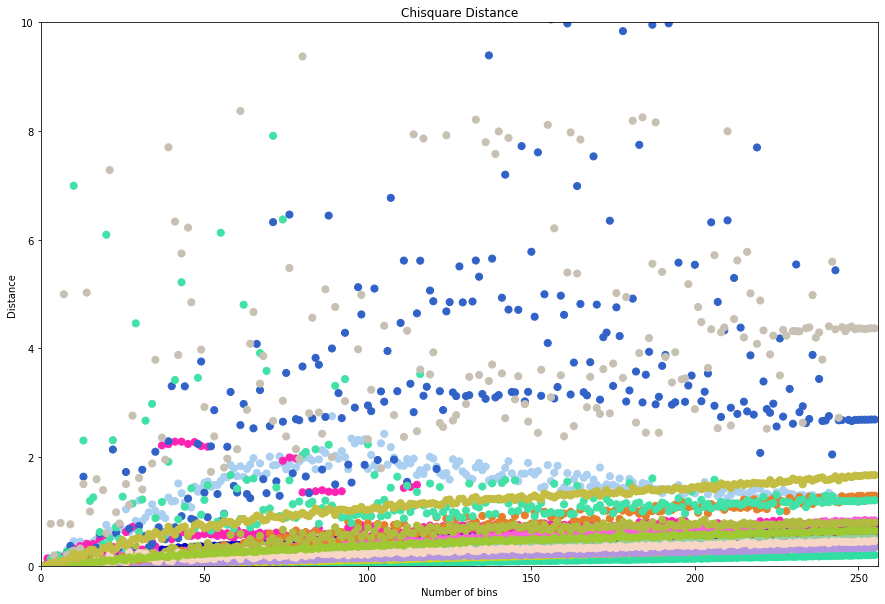

In [9]:
utils.plot_distance_method("Chisquare", distance, [0, 256], [0, 10])

### 3. Correlation

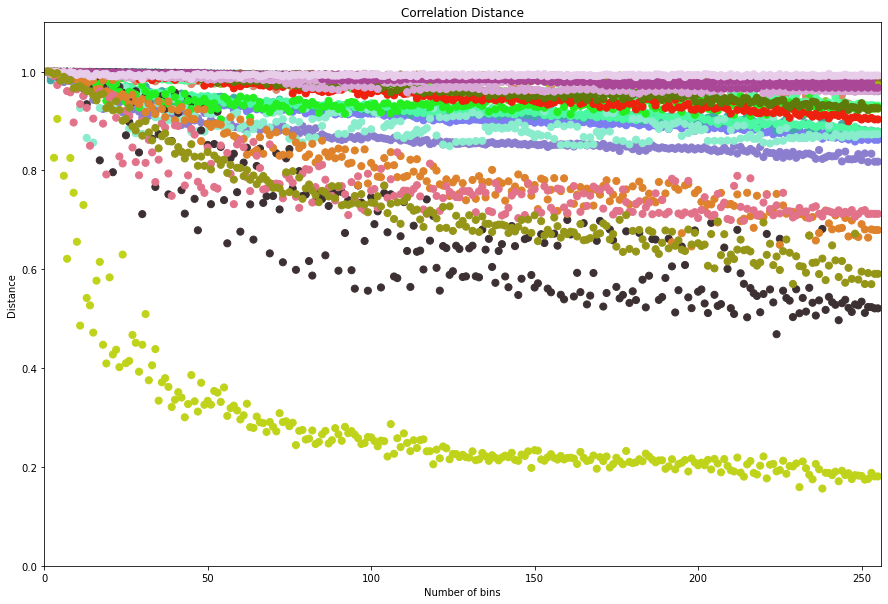

In [10]:
utils.plot_distance_method("Correlation", distance, [0, 256], [0, 1.1])

### 4. Chisquare Alt

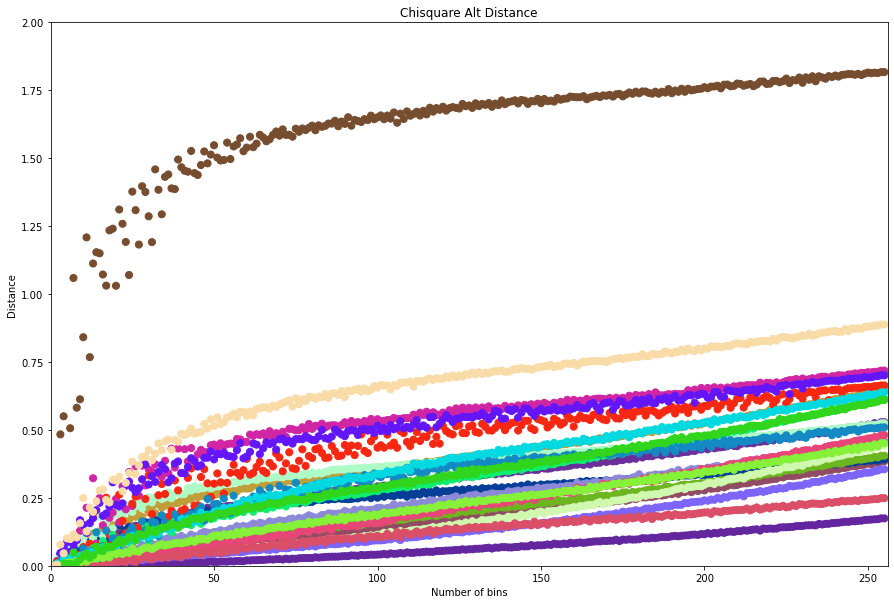

In [11]:
utils.plot_distance_method("Chisquare Alt", distance, [0, 256], [0, 2])

### 5. Intersect

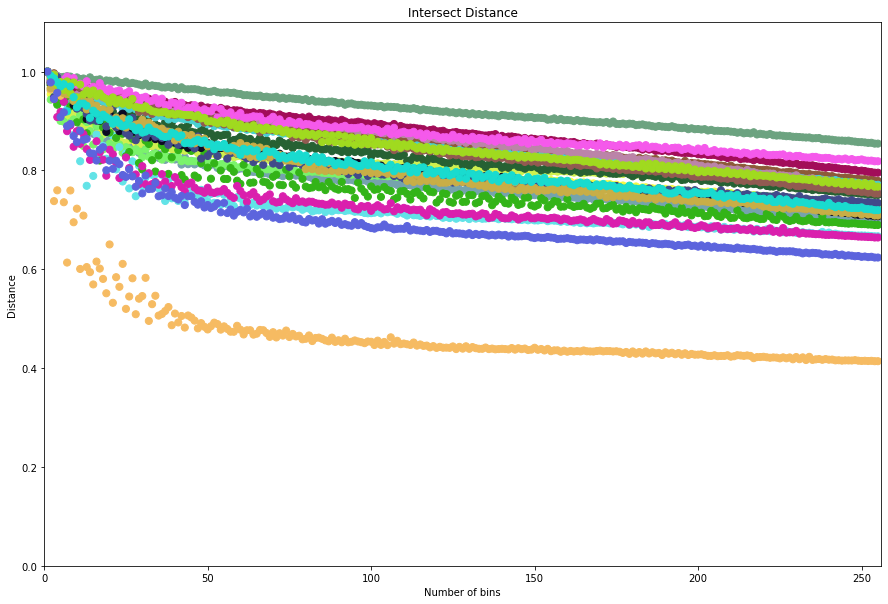

In [12]:
utils.plot_distance_method("Intersect", distance, [0, 256], [0, 1.1])

### 6. KL DIV

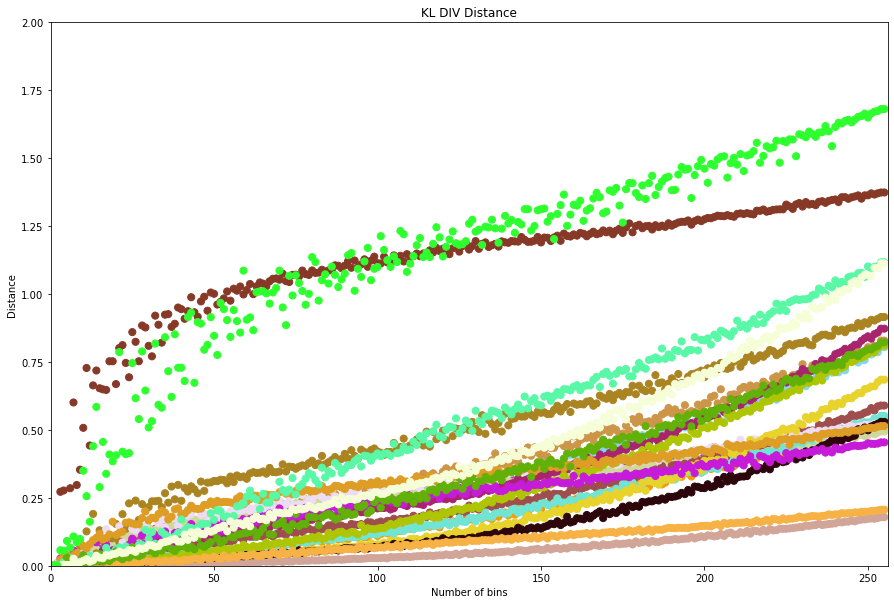

In [13]:
utils.plot_distance_method("KL DIV", distance, [0, 256], [0, 2])

## Comparacion de productos diferentes

In [14]:
distance_diff = pd.read_csv("csv/distance_diff.csv", sep=';')
meanstd_diff = pd.read_csv("csv/meanstd_diff.csv", sep=';')

En los graficos a continuación, los puntos rojos, son productos iguales, mientras que los puntos azules son productos diferentes.

### 1. Bhattacharyya

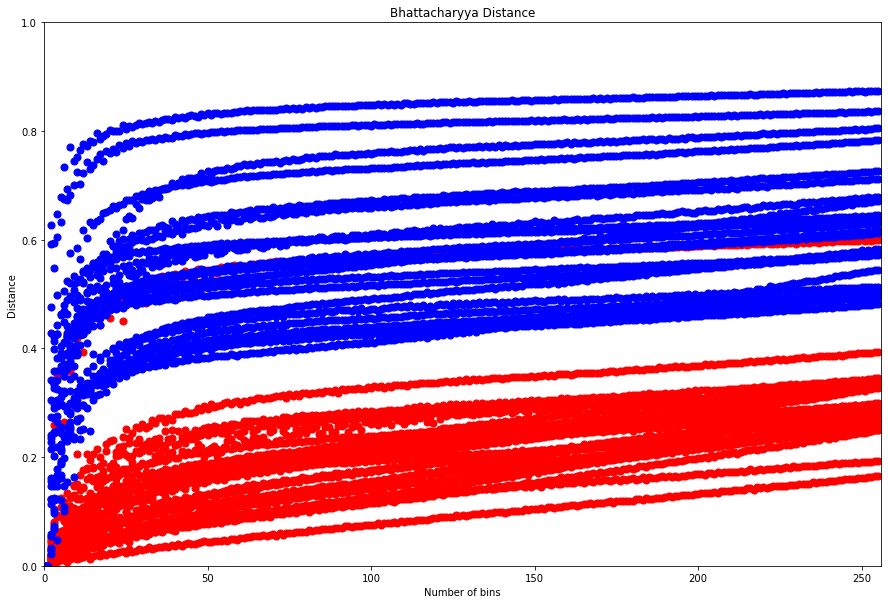

In [15]:
utils.plot_diff_distance("Bhattacharyya", distance, distance_diff, [0, 256], [0, 1])

### 2. Chisquare

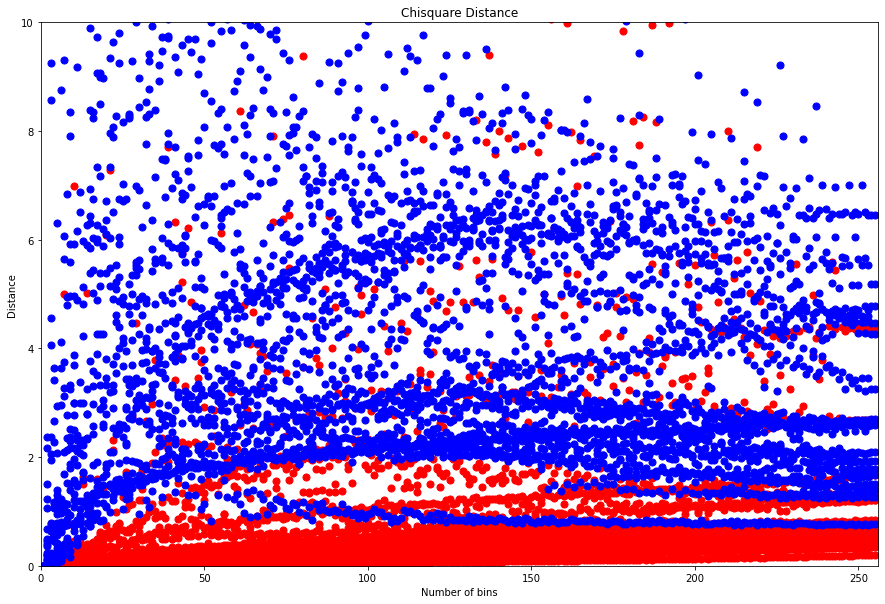

In [16]:
utils.plot_diff_distance("Chisquare", distance, distance_diff, [0, 256], [0, 10])

### 3. Correlation

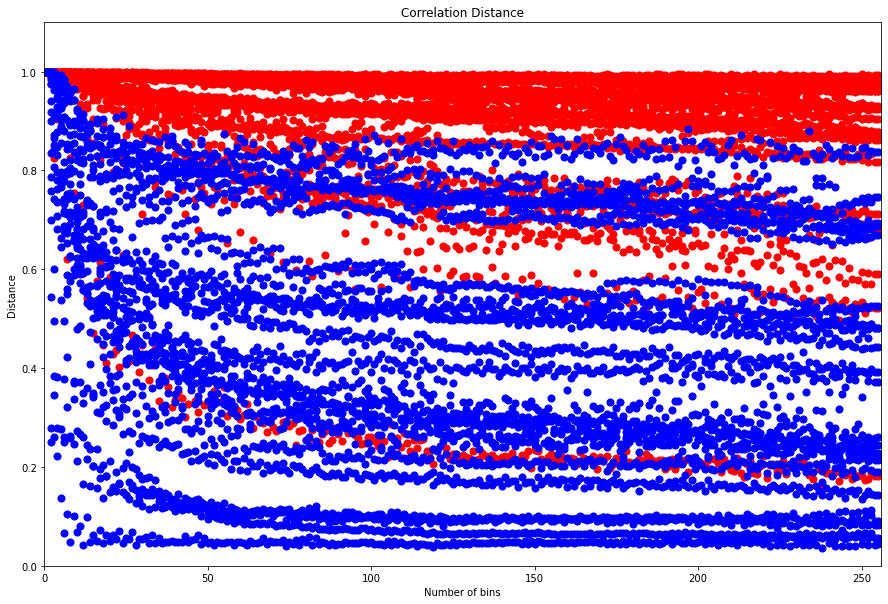

In [17]:
utils.plot_diff_distance("Correlation", distance, distance_diff, [0, 256], [0, 1.1])

### 4. Chisquare Alt

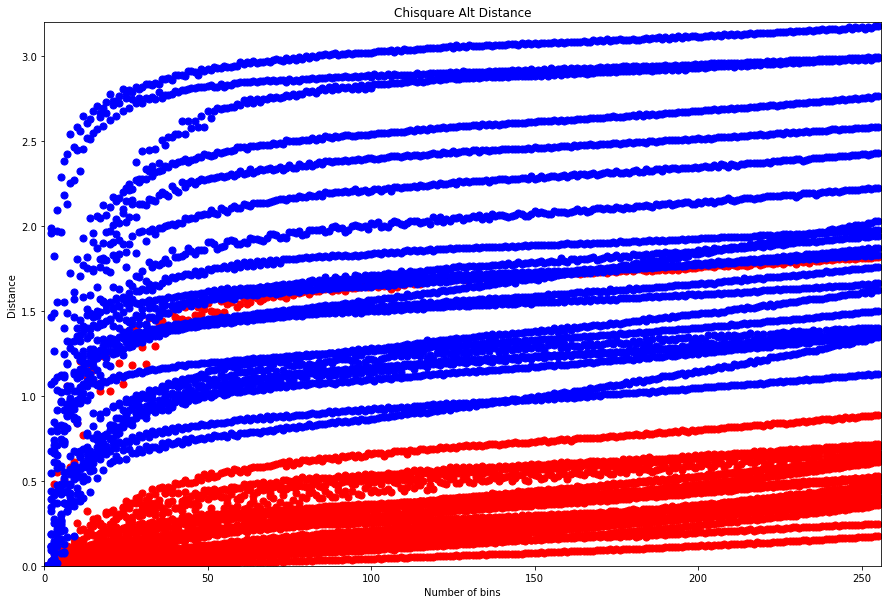

In [18]:
utils.plot_diff_distance("Chisquare Alt", distance, distance_diff, [0, 256], [0, 3.2])

### 5. Intersection

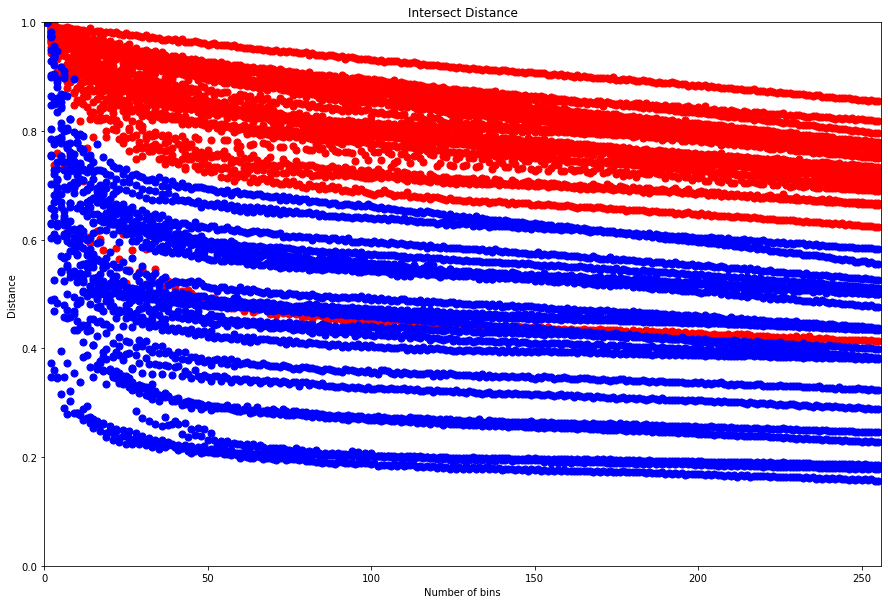

In [19]:
utils.plot_diff_distance("Intersect", distance, distance_diff, [0, 256], [0, 1])

### KL DIV

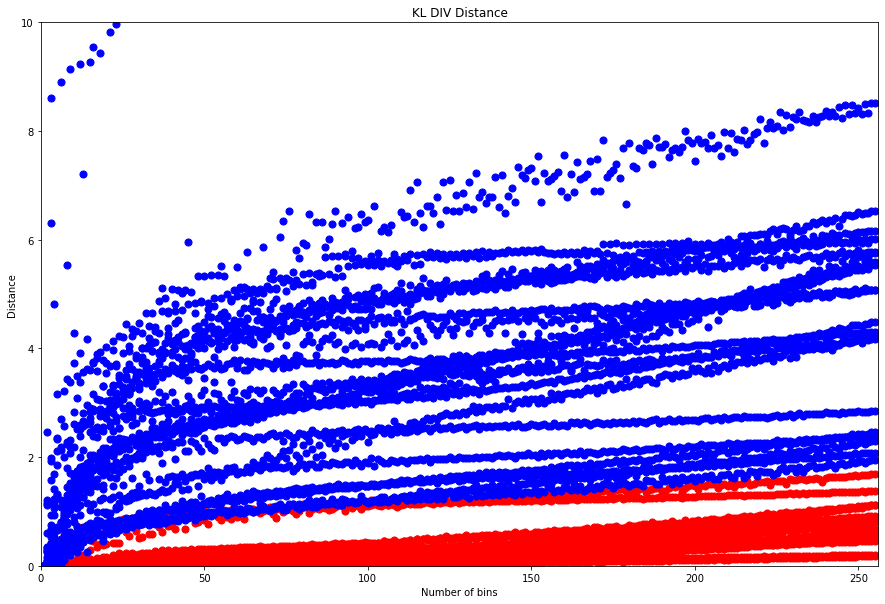

In [20]:
utils.plot_diff_distance("KL DIV", distance, distance_diff, [0, 256], [0, 10])

# Conclusiones

De los datos observados, el método más eficiente para identificar productos diferentes es Bhattacharyya, se puede observar que a medida que aumenta el numero de bins, las distancias se tornan más estable, creciendo linealmente, siendo el numero ideal de bins el "punto codo" de la gráfica, ya que representa el menor numero de bins que asegura una distancia representativa del producto en cuestión.